In [1]:
from datetime import datetime,timedelta
nb_st = datetime.utcnow()
print(f"\nNotebook START time: {nb_st} UTC\n")


Notebook START time: 2022-02-08 08:52:37.152197 UTC



In [2]:
import os
os.environ["CUDA_VISIBLE_DEVICES"] = "0"
import sys
from pathlib import Path
import matplotlib.pyplot as plt
import numpy as np
import torch

In [3]:
IMG_ROOT = Path('data/sample-images')
assert IMG_ROOT.is_dir()
print("Available samples:")
print(sorted([sample_dir.stem for sample_dir in IMG_ROOT.glob('sample-[0-9]*')]))

Available samples:
['sample-1', 'sample-10', 'sample-2', 'sample-3', 'sample-4', 'sample-5', 'sample-6', 'sample-7', 'sample-8', 'sample-9']


In [4]:
for sample_dir in sorted(IMG_ROOT.glob('sample-[0-9]*')):
    for img_name in ['color.jpg','mask.png','original.jpg']:
        if not (sample_dir/img_name).exists():
            raise Exception(f"MISSING: {(sample_dir/img_name).relative_to(IMG_ROOT)}")
else:
    print("All images are in place.")

All images are in place.


In [5]:
def visualize_result(image_arr, result_arr, mask_arr, image_name):
    fontdict = {'color':'white', 'fontsize':14, 'fontweight':'bold'}
    fig,ax = plt.subplots(nrows=2, ncols=2, figsize=(16,16))
    fig.set_facecolor("black")
    for row in ax:
        for ax_i in row:
            ax_i.set_axis_off()
    ax[0,0].imshow(np.transpose(image_arr.cpu().numpy(), [1, 2, 0]))
    ax[0,0].set_title(f"Original ({image_name}):",fontdict=fontdict)
    ax[0,1].imshow(np.transpose(np.concatenate([image_arr.cpu().numpy(),mask_arr.unsqueeze(0).cpu().numpy()]), [1, 2, 0]))
    ax[0,1].set_title("Original with alpha mask:",fontdict=fontdict)
    ax[1,0].imshow(np.transpose(result_arr.cpu().numpy(), [1, 2, 0]))
    ax[1,0].set_title(f"Color Corrected ({image_name}):",fontdict=fontdict)
    ax[1,1].imshow(np.transpose(np.concatenate([result_arr.cpu().numpy(),mask_arr.unsqueeze(0).cpu().numpy()]), [1, 2, 0]))
    ax[1,1].set_title("Color Corrected with alpha mask:",fontdict=fontdict)
    plt.tight_layout()
    plt.show()
    plt.close(fig)

In [6]:
from lib.boundary_pixel_extend import FillLowAlphaWithColor

In [7]:
import rasterio
from rasterio.errors import NotGeoreferencedWarning
import warnings
warnings.filterwarnings("ignore", category=NotGeoreferencedWarning)



INFO: **Testing USE_GPU=False case**




ERROR: data/sample-images/sample-1: Image size 3631x5688 and mask size 2526x3957 do not match! Skipping...


INFO: data/sample-images/sample-10: Image size (1618, 1080) and mask size (1618, 1080) match. Processing...
INFO: data/sample-images/sample-10: Done. Image processing time on CPU: 0:00:00.892939


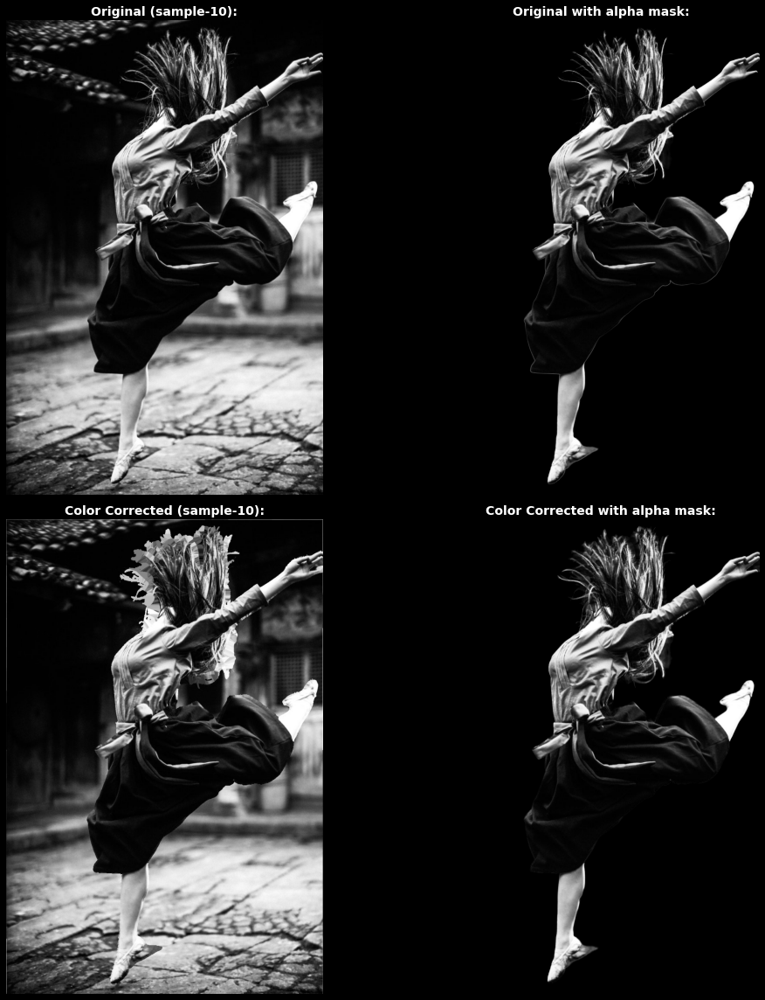

INFO: data/sample-images/sample-2: Image size (2000, 1540) and mask size (2000, 1540) match. Processing...
INFO: data/sample-images/sample-2: Done. Image processing time on CPU: 0:00:04.352383


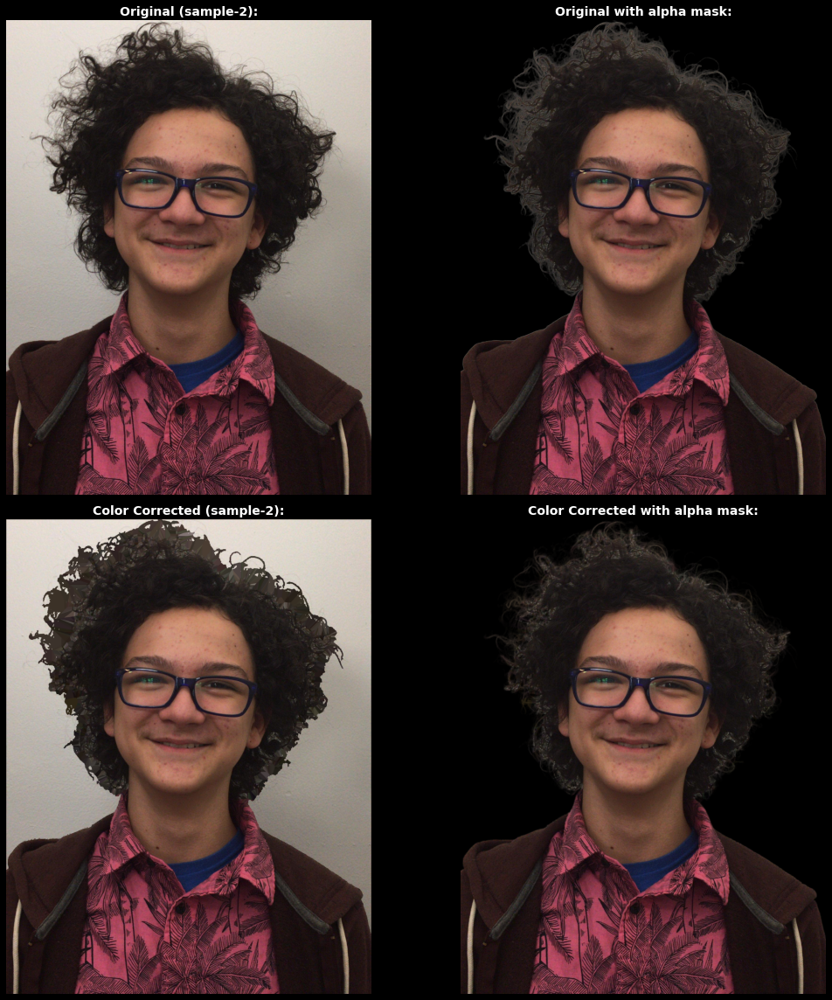

ERROR: data/sample-images/sample-3: Image size 1335x2000 and mask size 1335x923 do not match! Skipping...


INFO: data/sample-images/sample-4: Image size (1007, 750) and mask size (1007, 750) match. Processing...
INFO: data/sample-images/sample-4: Done. Image processing time on CPU: 0:00:00.466427


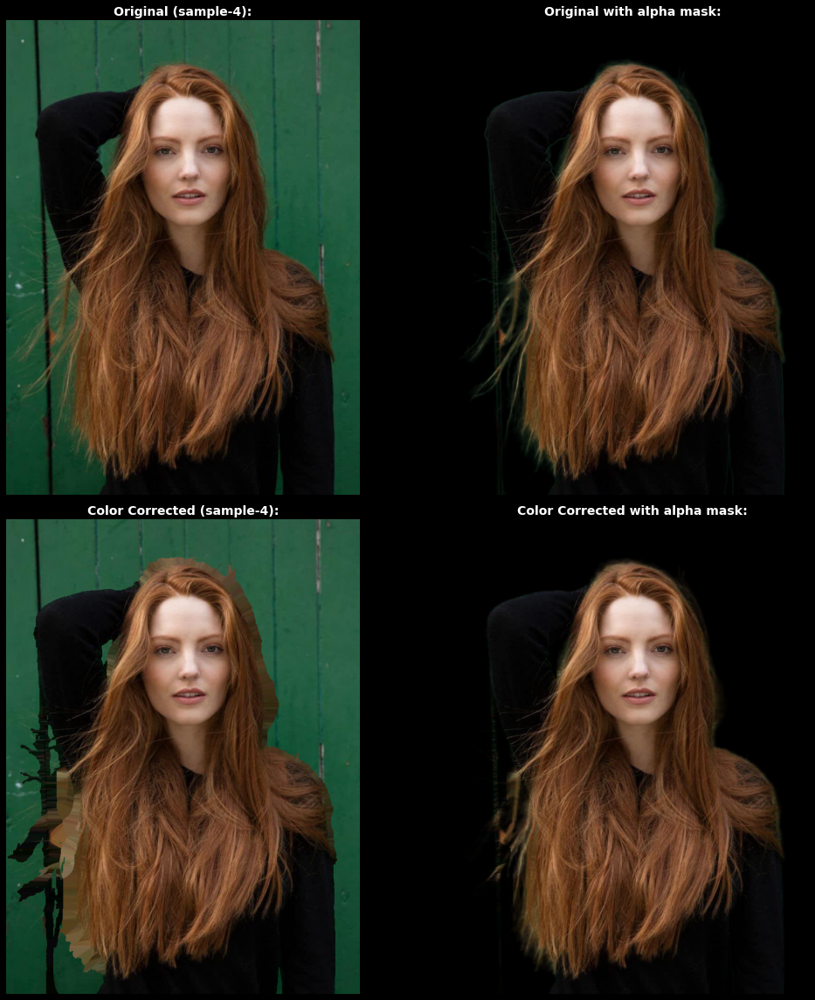

ERROR: data/sample-images/sample-5: Image size 3280x3280 and mask size 3162x3162 do not match! Skipping...


INFO: data/sample-images/sample-6: Image size (768, 1152) and mask size (768, 1152) match. Processing...
INFO: data/sample-images/sample-6: Done. Image processing time on CPU: 0:00:00.283681


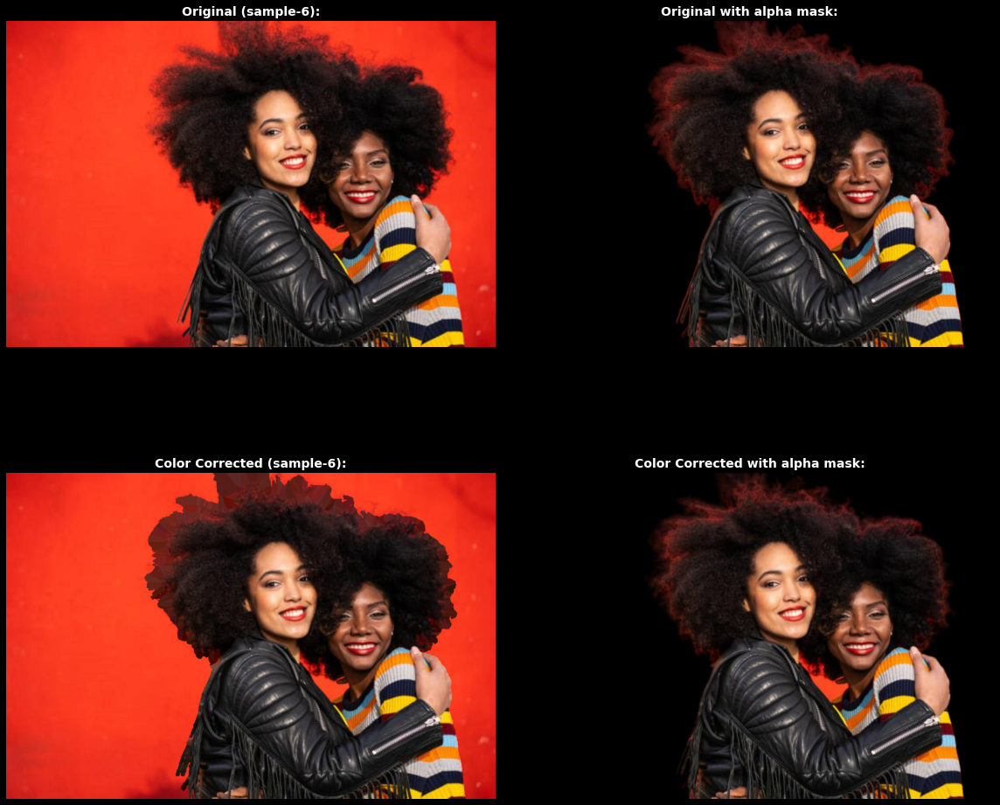

ERROR: data/sample-images/sample-7: Image size 4588x6875 and mask size 1760x1747 do not match! Skipping...


INFO: data/sample-images/sample-8: Image size (1351, 1080) and mask size (1351, 1080) match. Processing...
INFO: data/sample-images/sample-8: Done. Image processing time on CPU: 0:00:01.888456


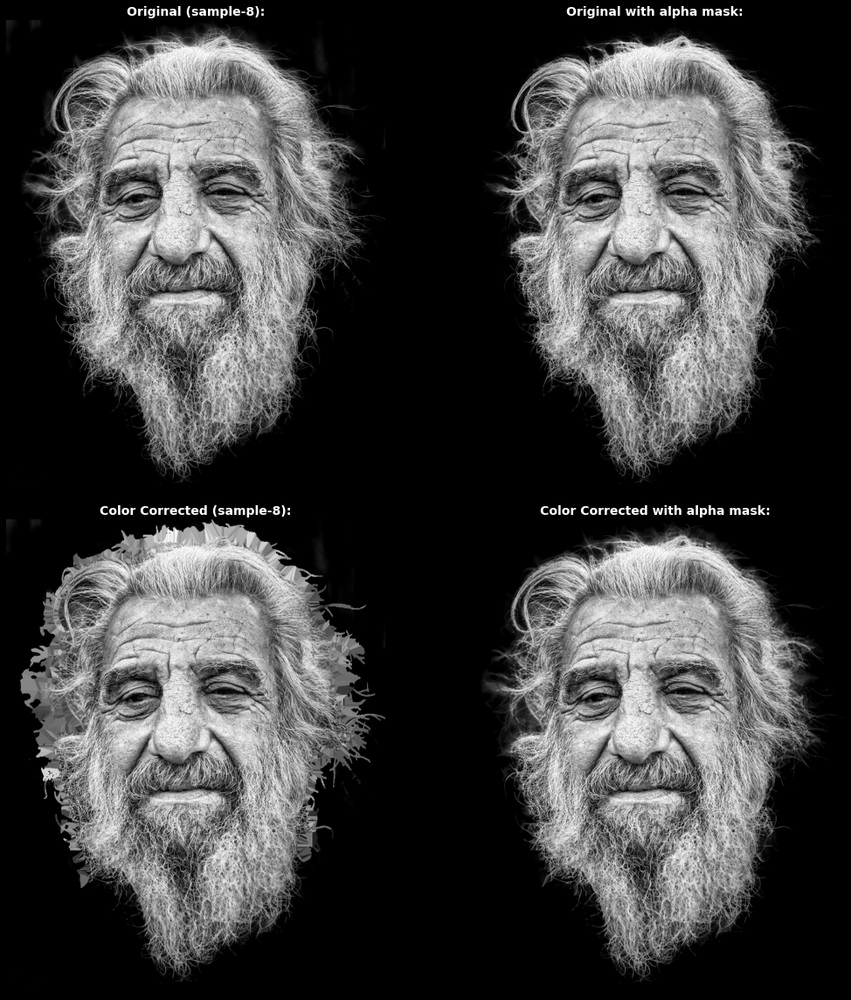

INFO: data/sample-images/sample-9: Image size (3850, 3080) and mask size (3850, 3080) match. Processing...
INFO: data/sample-images/sample-9: Done. Image processing time on CPU: 0:00:26.970042


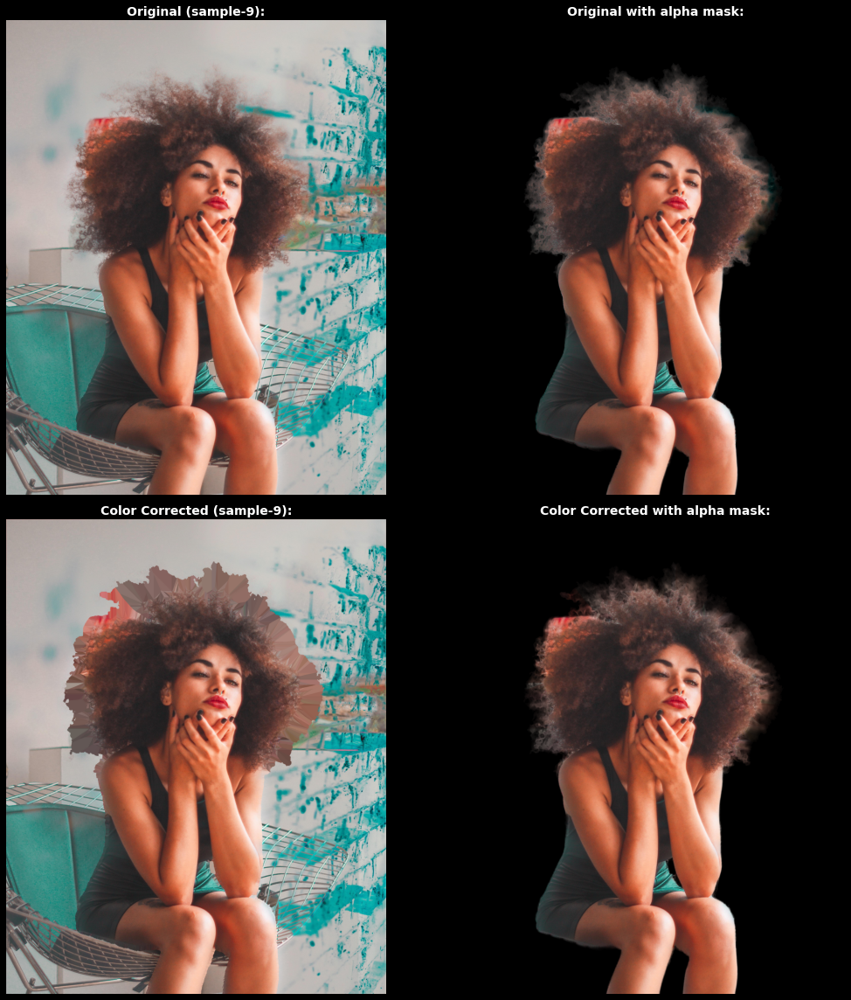

INFO: Processed 6 images
INFO: Processing times per sample:
       - [CPU] sample-10: 0:00:00.892939
       - [CPU] sample-2: 0:00:04.352383
       - [CPU] sample-4: 0:00:00.466427
       - [CPU] sample-6: 0:00:00.283681
       - [CPU] sample-8: 0:00:01.888456
       - [CPU] sample-9: 0:00:26.970042
INFO: Summary of processing times on CPU:
       - CPU minimum: 0:00:00.283681
       - CPU maximum: 0:00:26.970042
       - CPU avgerage: 0:00:05.808988


INFO: **Testing USE_GPU=True case**




ERROR: data/sample-images/sample-1: Image size 3631x5688 and mask size 2526x3957 do not match! Skipping...


INFO: data/sample-images/sample-10: Image size (1618, 1080) and mask size (1618, 1080) match. Processing...
INFO: data/sample-images/sample-10: Done. Image processing time on GPU: 0:00:00.178042


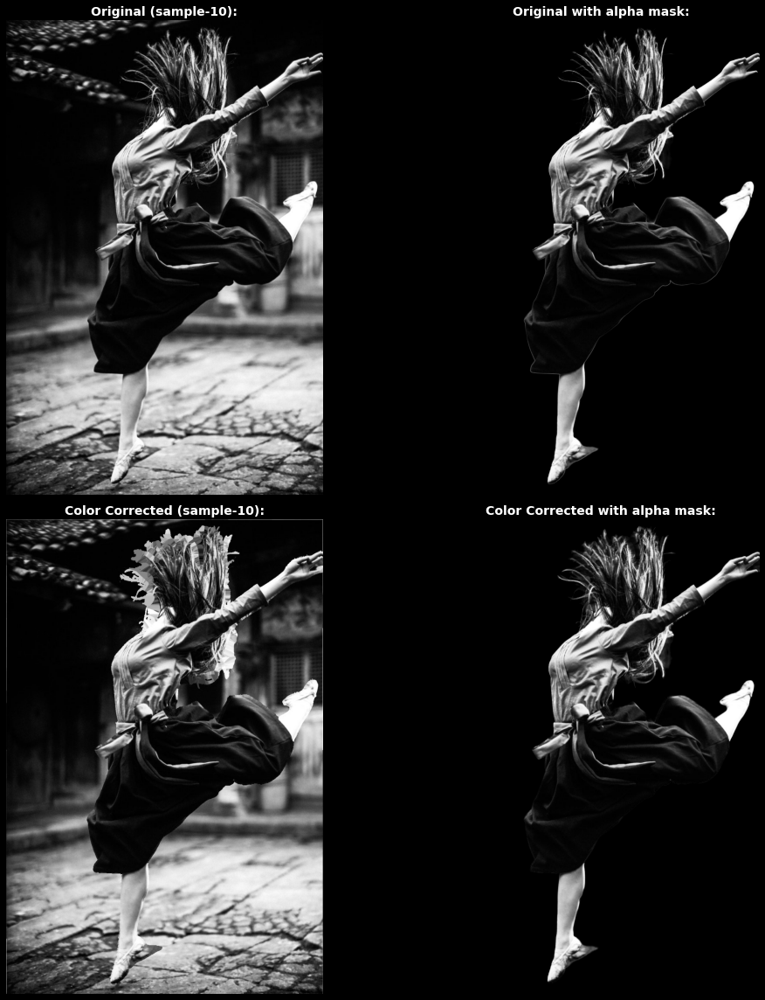

INFO: data/sample-images/sample-2: Image size (2000, 1540) and mask size (2000, 1540) match. Processing...
INFO: data/sample-images/sample-2: Done. Image processing time on GPU: 0:00:00.837663


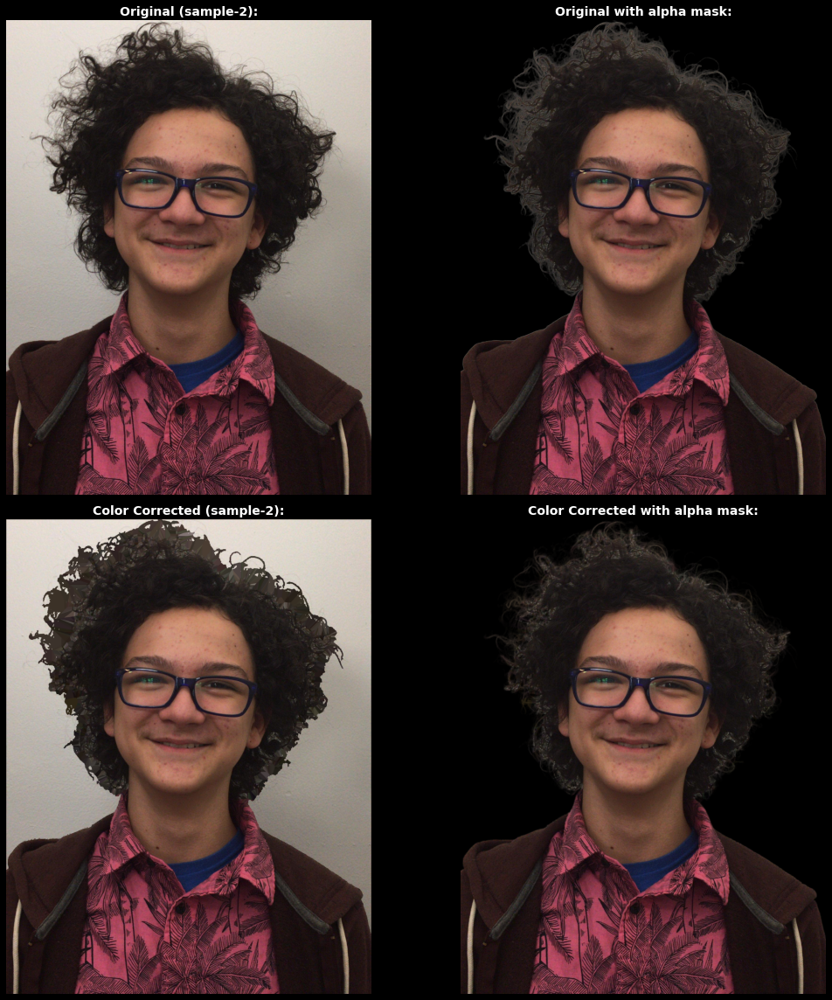

ERROR: data/sample-images/sample-3: Image size 1335x2000 and mask size 1335x923 do not match! Skipping...


INFO: data/sample-images/sample-4: Image size (1007, 750) and mask size (1007, 750) match. Processing...
INFO: data/sample-images/sample-4: Done. Image processing time on GPU: 0:00:00.089080


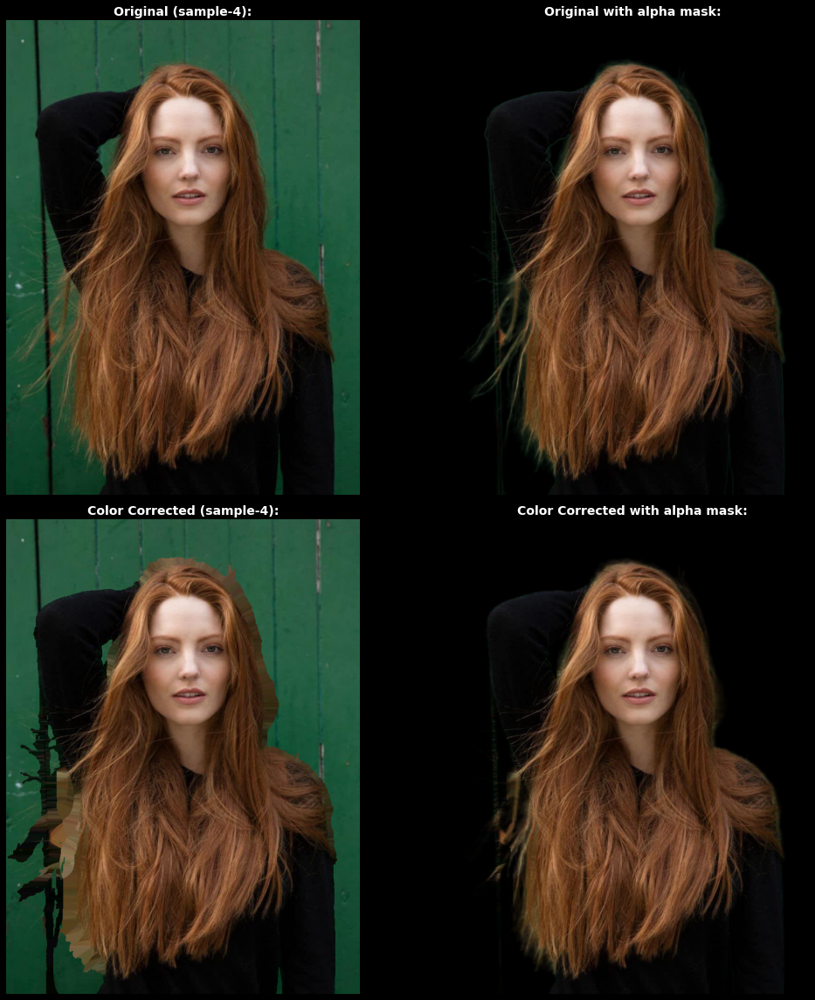

ERROR: data/sample-images/sample-5: Image size 3280x3280 and mask size 3162x3162 do not match! Skipping...


INFO: data/sample-images/sample-6: Image size (768, 1152) and mask size (768, 1152) match. Processing...
INFO: data/sample-images/sample-6: Done. Image processing time on GPU: 0:00:00.058148


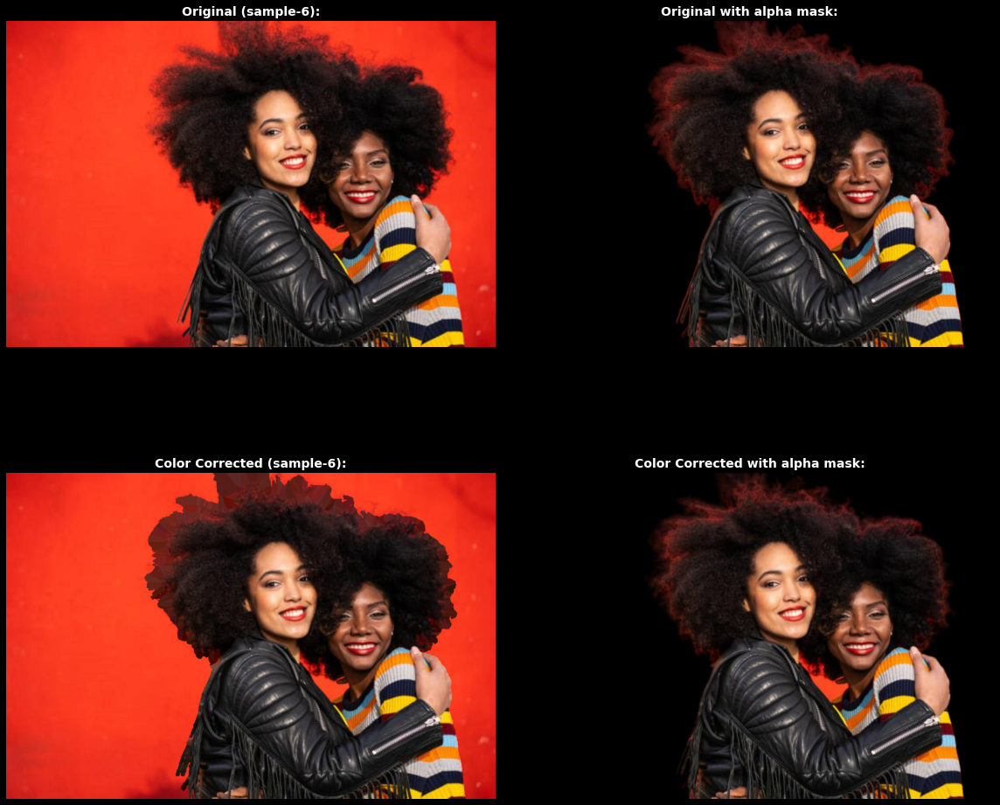

ERROR: data/sample-images/sample-7: Image size 4588x6875 and mask size 1760x1747 do not match! Skipping...


INFO: data/sample-images/sample-8: Image size (1351, 1080) and mask size (1351, 1080) match. Processing...
INFO: data/sample-images/sample-8: Done. Image processing time on GPU: 0:00:00.355633


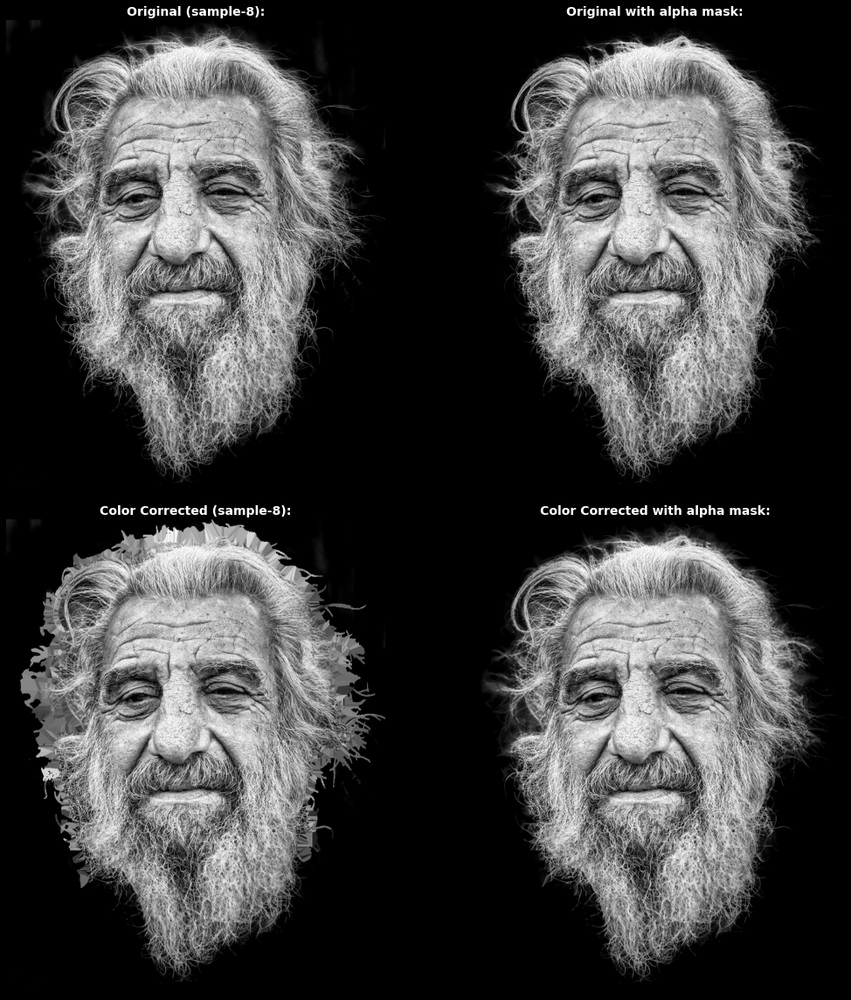

INFO: data/sample-images/sample-9: Image size (3850, 3080) and mask size (3850, 3080) match. Processing...
INFO: data/sample-images/sample-9: Done. Image processing time on GPU: 0:00:03.691190


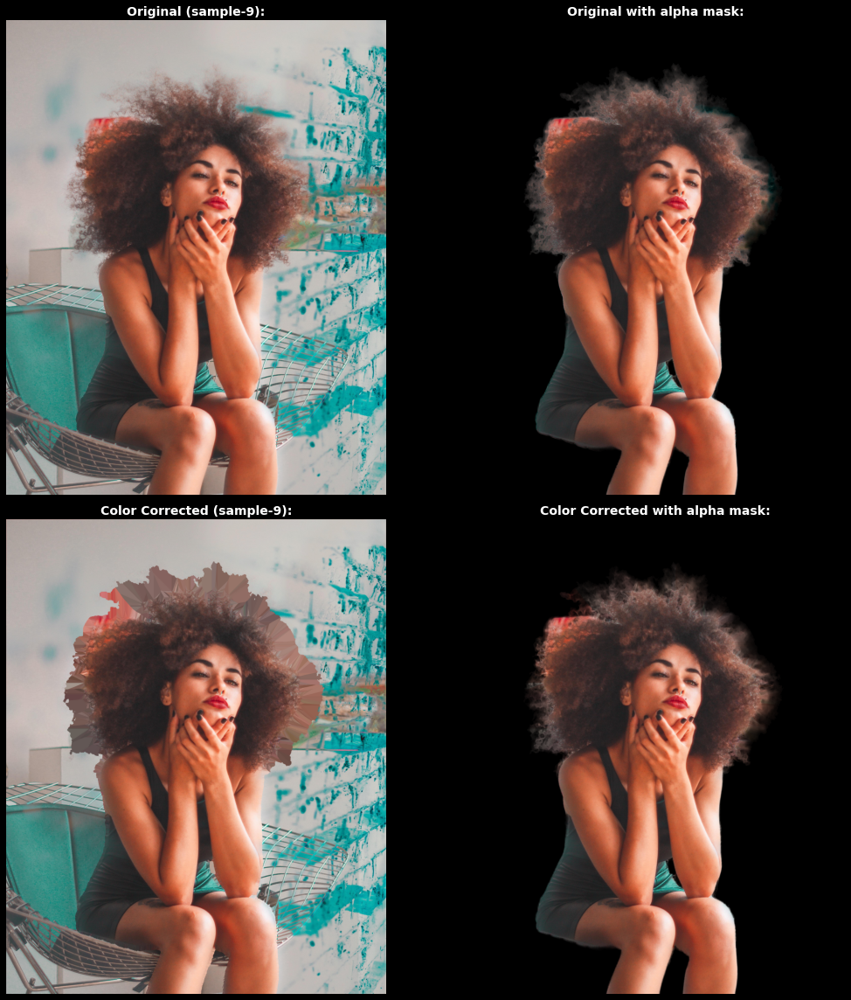

INFO: Processed 6 images
INFO: Processing times per sample:
       - [GPU] sample-10: 0:00:00.178042
       - [GPU] sample-2: 0:00:00.837663
       - [GPU] sample-4: 0:00:00.089080
       - [GPU] sample-6: 0:00:00.058148
       - [GPU] sample-8: 0:00:00.355633
       - [GPU] sample-9: 0:00:03.691190
INFO: Summary of processing times on GPU:
       - GPU minimum: 0:00:00.058148
       - GPU maximum: 0:00:03.691190
       - GPU avgerage: 0:00:00.868293


In [8]:
for USE_GPU in (False, True,):
    print(f"\n\nINFO: **Testing USE_GPU={USE_GPU} case**\n\n", flush=True)
    if USE_GPU and not torch.cuda.is_available():
        print(f"WARNING: USE_GPU={USE_GPU}, but cuda cappable device is not available on your machine. Skipping GPU part...", file=sys.stderr, flush=True)
        continue
        
    transform = FillLowAlphaWithColor(gpu=USE_GPU)
    # print("INFO: Using image transformer: ", transform, flush=True)


    n_img_processed = 0
    processing_time_total = timedelta(seconds=0)
    min_td = timedelta(seconds=100000)
    max_td = timedelta(seconds=0)
    stats = {}

    for sample_dir in sorted(IMG_ROOT.glob('sample-[0-9]*')):
        with rasterio.open(sample_dir/'original.jpg') as img:
            image_arr = img.read()
        with rasterio.open(sample_dir/'mask.png') as img:
            mask_arr = img.read()
        image_arr = torch.as_tensor(image_arr)
        mask_arr = torch.as_tensor(mask_arr.squeeze())
        orig_image_arr = image_arr.clone().detach()

        if image_arr.shape[-2:] != mask_arr.shape:
            print(f"ERROR: {sample_dir}:"
                  f" Image size {image_arr.shape[-2]}x{image_arr.shape[-1]} "
                  f"and mask size {mask_arr.shape[0]}x{mask_arr.shape[1]} do not match! Skipping...",
                  file=sys.stderr, flush=True)
            continue
        else:
            print(f"INFO: {sample_dir}: Image size {tuple(image_arr.shape[-2:])} and mask size {tuple(mask_arr.shape)} match. Processing...", flush=True)
        processing_start_time = datetime.now()

        result_arr, mask_arr = transform(image_arr, mask_arr)

        processing_end_time = datetime.now()
        n_img_processed += 1
        processing_td = processing_end_time - processing_start_time
        processing_time_total += processing_td
        stats[sample_dir.stem] = processing_td
        if min_td > processing_td:
            min_td = processing_td
        if max_td < processing_td:
            max_td = processing_td
        print(f"INFO: {sample_dir}: Done. Image processing time on {'GPU' if USE_GPU and torch.cuda.is_available() else 'CPU'}: {processing_td}", flush=True)

        visualize_result(orig_image_arr, result_arr, mask_arr, image_name=sample_dir.stem)

    print(f"INFO: Processed {n_img_processed} images", flush=True)
    print(f"INFO: Processing times per sample:", flush=True)
    for k in stats:
        print(f"       - [{'GPU' if USE_GPU and torch.cuda.is_available() else 'CPU'}] {k}: {stats[k]}", flush=True)
    print(f"INFO: Summary of processing times on {'GPU' if USE_GPU and torch.cuda.is_available() else 'CPU'}:", flush=True)
    print(f"       - {'GPU' if USE_GPU and torch.cuda.is_available() else 'CPU'} minimum: {min_td}", flush=True)
    print(f"       - {'GPU' if USE_GPU and torch.cuda.is_available() else 'CPU'} maximum: {max_td}", flush=True)
    print(f"       - {'GPU' if USE_GPU and torch.cuda.is_available() else 'CPU'} avgerage: {processing_time_total/n_img_processed}", flush=True)
    

In [9]:
print(f"\n ** Total Elapsed time: {datetime.utcnow() - nb_st} ** \n")
print(f"Notebook END time: {datetime.utcnow()} UTC\n")


 ** Total Elapsed time: 0:01:01.579391 ** 

Notebook END time: 2022-02-08 08:53:38.731670 UTC

